<a href="https://colab.research.google.com/github/AlejandroVasquez3/Cohort-18-Projects/blob/main/Project-3/big_query_nytrees_rev_002.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Practicing SQL Queries Using BigQuery

We will be looking at the "NY Trees" dataset located [here](https://console.cloud.google.com/bigquery?hl=en&inv=1&invt=Ab1gkQ&project=ddds-c18-bq&ws=!1m4!1m3!3m2!1sbigquery-public-data!2snew_york_trees).


- Quick Notes on the  Dataset:
- Looking at 2015 NY Tree Census
  - Data collected by 2,200 volunteers and staff
  - Over 660,000 trees map across the 5 boroughs
  - Volunteers utilized the following tools to gather information.
    - Mapping tools
    - Survey wheels
    - Tape measures
    - Tree identification keys
- The dataset was used to build the **Forestry Management System (ForMS)**, an operational database for managing NYC's urban forest. It also helps with **urban tree management, environmental planning, and community engagement** in green initiatives.

## Setup

In [1]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt


from google.cloud import bigquery
from google.colab import auth
from google.colab import userdata

auth.authenticate_user()

In [2]:
# assign the project ID for BILLING purposes, i.e. who is going to pay for the query?
project_id = userdata.get('bq_billing_project_id')


In [3]:
# Create client object
client = bigquery.Client(project=project_id)


## Initial Exploration

### List the data sets


In [4]:
# assign the project ID that OWNS the data set
owner_project_id = "bigquery-public-data"


In [5]:
# assign the project ID that OWNS the data set
owner_project_id = "bigquery-public-data"

# Construct a reference to the "covid19_google_mobility" dataset
project_dataset = "new_york_trees"
# project_dataset = "bitcoin_blockchain"

dataset_ref = client.dataset(project_dataset, project=owner_project_id)

# API request - fetch the dataset
dataset = client.get_dataset(dataset_ref)

# Get all the tables in the dataset
tables = list(client.list_tables(dataset))

# Print names of all tables in the dataset
for table in tables:
  print(table.table_id)

tree_census_1995
tree_census_2005
tree_census_2015
tree_species


### Look at the table schema

In [6]:
# Construct a reference to the "mobility report" table
table_ref = dataset.table("tree_census_2015")

# API request - fetch the table
table = client.get_table(table_ref)

# See the table's schema - name, field type, mode, description
table.schema

[SchemaField('tree_id', 'INTEGER', 'REQUIRED', None, 'Unique identification number for each tree point', (), None),
 SchemaField('block_id', 'INTEGER', 'NULLABLE', None, 'Identifier linking each tree to the block in the blockface table/shapefile that it is mapped on.', (), None),
 SchemaField('created_at', 'DATE', 'NULLABLE', None, 'The date tree points were collected in the census software', (), None),
 SchemaField('tree_dbh', 'INTEGER', 'NULLABLE', None, 'Diameter of the tree, measured at approximately 54" / 137cm above the ground.', (), None),
 SchemaField('stump_diam', 'INTEGER', 'NULLABLE', None, 'Diameter of stump measured through the center, rounded to the nearest inch.', (), None),
 SchemaField('curb_loc', 'STRING', 'NULLABLE', None, 'Location of tree bed in relationship to the curb; trees are either along the curb (OnCurb) or offset from the curb (OffsetFromCurb)', (), None),
 SchemaField('status', 'STRING', 'NULLABLE', None, 'Indicates whether the tree is alive, standing dead

#### Schema in a dataframe

In [7]:
fields = pd.DataFrame( [ x.to_api_repr() for x in table.schema ] )
fields.shape


(41, 4)

In [8]:
x = table.schema[0]
x.to_api_repr()

{'name': 'tree_id',
 'type': 'INTEGER',
 'mode': 'REQUIRED',
 'description': 'Unique identification number for each tree point'}

In [9]:
[ x.to_api_repr() for x in table.schema ][:3]

[{'name': 'tree_id',
  'type': 'INTEGER',
  'mode': 'REQUIRED',
  'description': 'Unique identification number for each tree point'},
 {'name': 'block_id',
  'type': 'INTEGER',
  'mode': 'NULLABLE',
  'description': 'Identifier linking each tree to the block in the blockface table/shapefile that it is mapped on.'},
 {'name': 'created_at',
  'type': 'DATE',
  'mode': 'NULLABLE',
  'description': 'The date tree points were collected in the census software'}]

In [10]:
fields


,name,type,mode,description
0,tree_id,INTEGER,REQUIRED,Unique identification number for each tree point
1,block_id,INTEGER,NULLABLE,Identifier linking each tree to the block in t...
2,created_at,DATE,NULLABLE,The date tree points were collected in the cen...
3,tree_dbh,INTEGER,NULLABLE,"Diameter of the tree, measured at approximatel..."
4,stump_diam,INTEGER,NULLABLE,"Diameter of stump measured through the center,..."
5,curb_loc,STRING,NULLABLE,Location of tree bed in relationship to the cu...
6,status,STRING,NULLABLE,"Indicates whether the tree is alive, standing ..."
7,health,STRING,NULLABLE,Indicates the user's perception of tree health.
8,spc_latin,STRING,NULLABLE,"Scientific name for species, e.g. ""Acer rubrum"""
9,spc_common,STRING,NULLABLE,"Common name for species, e.g. ""red maple"""


In [11]:
# Preview the first five lines of the table
client.list_rows(table, max_results=5).to_dataframe()

,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,st_assem,st_senate,nta,nta_name,boro_ct,state,latitude,longitude,x_sp,y_sp
0,80548,502982,2015-07-20,0,16,OnCurb,Stump,None,None,None,...,77,32,BX14,East Concourse-Concourse Village,2018301,New York,40.829143,-73.919927,1006409.745,241366.4842
1,449489,503216,2015-11-12,0,4,OnCurb,Stump,None,None,None,...,77,29,BX26,Highbridge,2018900,New York,40.833504,-73.930096,1003594.243,242952.9505
2,449293,503196,2015-11-12,0,5,OnCurb,Stump,None,None,None,...,84,29,BX26,Highbridge,2018900,New York,40.832046,-73.928894,1003927.349,242422.1871
3,449153,503188,2015-11-12,0,10,OnCurb,Stump,None,None,None,...,84,29,BX26,Highbridge,2018900,New York,40.833093,-73.928451,1004049.461,242803.4738
4,449148,503152,2015-11-12,0,5,OnCurb,Stump,None,None,None,...,84,29,BX26,Highbridge,2018900,New York,40.832840,-73.929510,1003756.562,242711.2955


##  Add safe config settings

Set constants for sizes

In [12]:
ONE_MB = 1_000*1_000
ONE_GB = 1_000*ONE_MB

Sample Query 1 - NY Trees - Dry Run
You can use a 'dry run' to estimate the size of a query before running it.

In [13]:
query = """
        SELECT *
        FROM bigquery-public-data.new_york_trees.tree_census_2015
        LIMIT 5
        """

dry_run_config = bigquery.QueryJobConfig(dry_run = True)
dry_run_query_job = client.query(query, job_config= dry_run_config)
size = dry_run_query_job.total_bytes_processed
print(f"{size:_}")

233_527_031


Sample Query 1 - Ny Trees - Safe Config
You can also specify a limit for how much data you want to scan.

In [14]:
# This line should be included every time
# It seems like you should be able to set it and reuse it, but that doesn't work
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=ONE_MB)

safe_query_job = client.query(query, job_config=safe_config)
df = safe_query_job.to_dataframe()
df.head()

,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,st_assem,st_senate,nta,nta_name,boro_ct,state,latitude,longitude,x_sp,y_sp
0,80548,502982,2015-07-20,0,16,OnCurb,Stump,None,None,None,...,77,32,BX14,East Concourse-Concourse Village,2018301,New York,40.829143,-73.919927,1006409.745,241366.4842
1,449489,503216,2015-11-12,0,4,OnCurb,Stump,None,None,None,...,77,29,BX26,Highbridge,2018900,New York,40.833504,-73.930096,1003594.243,242952.9505
2,449293,503196,2015-11-12,0,5,OnCurb,Stump,None,None,None,...,84,29,BX26,Highbridge,2018900,New York,40.832046,-73.928894,1003927.349,242422.1871
3,449153,503188,2015-11-12,0,10,OnCurb,Stump,None,None,None,...,84,29,BX26,Highbridge,2018900,New York,40.833093,-73.928451,1004049.461,242803.4738
4,449148,503152,2015-11-12,0,5,OnCurb,Stump,None,None,None,...,84,29,BX26,Highbridge,2018900,New York,40.832840,-73.929510,1003756.562,242711.2955


In [15]:
df.shape

(5, 41)

## Pulling Data from NY Trees Database

#### All entries

In [16]:
# Pull all entries with our desired info

safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=ONE_GB)
query = """
        SELECT created_at, tree_id, spc_latin, spc_common, latitude, longitude, zipcode, boroname
        FROM bigquery-public-data.new_york_trees.tree_census_2015

        """
df_all_entries = client.query(query, job_config=safe_config).to_dataframe()
df_all_entries.head()

,created_at,tree_id,spc_latin,spc_common,latitude,longitude,zipcode,boroname
0,2015-07-20,80549,Cornus alternifolia,pagoda dogwood,40.829095,-73.919785,10451,Bronx
1,2015-11-12,451316,Fraxinus,ash,40.828278,-73.920602,10451,Bronx
2,2015-11-12,451261,Maackia amurensis,Amur maackia,40.828816,-73.919878,10451,Bronx
3,2015-11-12,451260,Maackia amurensis,Amur maackia,40.828899,-73.919832,10451,Bronx
4,2015-11-12,449423,Cercidiphyllum japonicum,katsura tree,40.833306,-73.927544,10452,Bronx


In [17]:
# Verifyt date datatype
df_all_entries.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 683788 entries, 0 to 683787
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   created_at  683788 non-null  dbdate 
 1   tree_id     683788 non-null  Int64  
 2   spc_latin   652169 non-null  object 
 3   spc_common  652169 non-null  object 
 4   latitude    683788 non-null  float64
 5   longitude   683788 non-null  float64
 6   zipcode     683788 non-null  Int64  
 7   boroname    683788 non-null  object 
dtypes: Int64(2), dbdate(1), float64(2), object(3)
memory usage: 43.0+ MB


#### Distribution of Tree Entries Over Time

In [18]:
# When was the data captured?
fig =  px.histogram(df_all_entries,  x= "created_at" )
# Figure layout
fig.update_layout(
    title_text='Distribution of Tree Entries Over Time',
    xaxis_title_text='Date of Entry',
    yaxis_title_text='Number of Entries',
    bargap=0.1,
    xaxis_rangeselector_buttons=list([
        dict(count=1, label="1m", step="month", stepmode="backward"),
        dict(count=6, label="6m", step="month", stepmode="backward"),
        dict(count=1, label="YTD", step="year", stepmode="todate"),
        dict(count=1, label="1y", step="year", stepmode="backward"),
        dict(step="all")
    ])
)
fig.show()

In [19]:
data_prefix = 'bigquery-public-data.new_york_trees'
data_table = 'tree_species'

#### Fall Color data

In [20]:
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=(ONE_MB*100))
query = f"""
        SELECT species_scientific_name, species_common_name, form, growth_rate, fall_color
        FROM {data_prefix}.{data_table}
        ORDER BY species_scientific_name
        """
df_tree_dict = client.query(query, job_config = safe_config).to_dataframe()
df_tree_dict.head()

,species_scientific_name,species_common_name,form,growth_rate,fall_color
0,Acer campestre,Hedge Maple,Rounded,Slow,Yellow
1,Acer ginnala,Amur Maple,Rounded,Slow,Red
2,Acer rubrum,Red Maple,Rounded,Medium,Red
3,Acer truncatum,Shantung Maple,Rounded,Slow,Yellow
4,Amelanchier sp.,Serviceberry,Rounded,Slow,Red/ Yellow


In [21]:
species = df_tree_dict['species_scientific_name']
print(f"There are {species.count()} species of trees recorded in NY")

There are 57 species of trees recorded in NY


In [22]:
colors =  df_tree_dict["fall_color"].value_counts()
print(f"\n\nTotal of Fall colors reportedly found in NY {len(colors)}")



Total of Fall colors reportedly found in NY 13


In [23]:
# Using SQL to Get COUNT of Fall colors found in NY
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=(ONE_MB*100))
query = f"""
        SELECT  fall_color, COUNT(*) as Count
        FROM {data_prefix}.{data_table}
        GROUP BY fall_color
        ORDER BY Count DESC
        """
df = client.query(query, job_config = safe_config).to_dataframe()

df


,fall_color,Count
0,Yellow,31
1,Maroon,7
2,Red/Bronze,4
3,Yellow/Orange,3
4,Red,3
5,Orange/Brown,2
6,Yellow/Bronze,1
7,Red/Orange,1
8,Red/ Yellow,1
9,Red/ yellow,1


#### Distribution of Tree Fall Colors of tree species

In [24]:
fig =  px.histogram(df,  x= "fall_color", y= "Count")
fig.update_layout(
    title_text='Distribution of Tree Fall Colors of tree species',

    xaxis_title_text='Fall Color',
    yaxis_title_text='Number of Trees',
    bargap=0.1
)
fig.show()

#### Plotting of Tree Locations


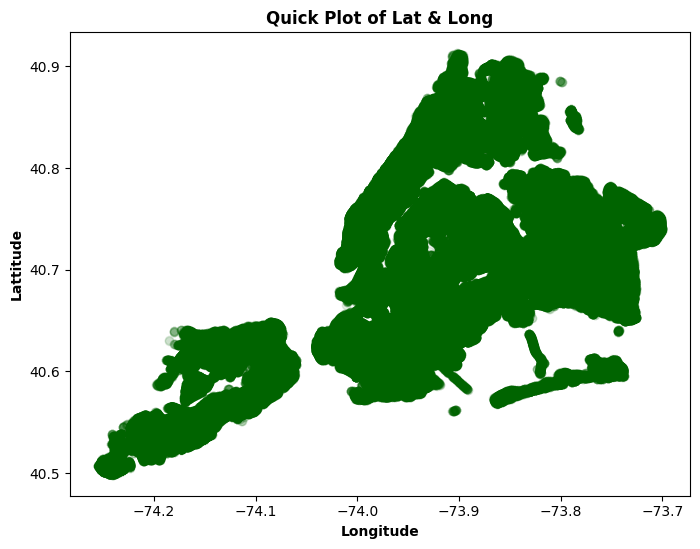

In [42]:
plt.figure(figsize=(8,8));
ax=plt.subplot(aspect='equal');
plt.title("Quick Plot of Lat & Long", weight="bold")
plt.xlabel("Longitude", weight="bold")
plt.ylabel("Lattitude", weight="bold")

plt.scatter(df_all_entries["longitude"], df_all_entries["latitude"], alpha=0.1, color='darkgreen');
plt.show();

In [26]:
# fig = px.scatter_map(
#     df_all_entries,
#     lat="latitude",
#     lon="longitude",
#     # hover_name="boroname",
#     # hover_data=["boroname", "zipcode"],
#     color_discrete_sequence=["fuchsia"],
#     center=dict(lat=40.7, lon=-74),
#     zoom=9,
#     width=600,
#     height=500,
# )

# fig.update_layout(
#     margin={"r": 0, "t": 0, "l": 0, "b": 0},
#     mapbox=dict(
#         # Map-Style Choice
#         style="carto-darkmatter",
#         # Map Bounds
#         bounds=dict(
#             west=-74.5,
#             east=-73.5,
#             south=40.4,
#             north=41.2
#         )
#     )
# )

# fig.show()

In [27]:
# fig = px.scatter_map(
#     df_all_entries,
#     lat="latitude",
#     lon="longitude",
#     hover_name="boroname",
#     color = "spc_common",
#     hover_data=["spc_common"],
#     color_discrete_sequence=px.colors.qualitative.Dark2,
#     center=dict(lat=40.7, lon=-74),
#     zoom=9,
#     width=600,
#     height=500,
# )

# fig.update_layout(
#     margin={"r": 0, "t": 0, "l": 0, "b": 0},
#     mapbox=dict(
#         # Map-Style Choice
#         style="carto-darkmatter",
#         # Map Bounds
#         bounds=dict(
#             west=-74.5,
#             east=-73.5,
#             south=40.4,
#             north=41.2
#         )
#     )
# )


# fig.show()

In [28]:
# making data frame of NaN in spc_latin spc_common, For when we want to Map Species found
df_all_entries_cleaned = df_all_entries.dropna(subset=['spc_latin', 'spc_common']).copy()
df_all_entries_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 652169 entries, 0 to 683787
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   created_at  652169 non-null  dbdate 
 1   tree_id     652169 non-null  Int64  
 2   spc_latin   652169 non-null  object 
 3   spc_common  652169 non-null  object 
 4   latitude    652169 non-null  float64
 5   longitude   652169 non-null  float64
 6   zipcode     652169 non-null  Int64  
 7   boroname    652169 non-null  object 
dtypes: Int64(2), dbdate(1), float64(2), object(3)
memory usage: 46.0+ MB


In [29]:
# Merging Dataframes based on the scientific name entry

df_all_entries_with_fall_color = pd.merge(
    df_all_entries,
    df_tree_dict[['species_scientific_name', 'fall_color','form', 'growth_rate']], # Select only necessary columns from df_tree_dict
    left_on='spc_latin',       # Column from df_all_entries
    right_on='species_scientific_name', # Column from df_tree_dict
    how='left'                  # Type of join
)
df_all_entries_with_fall_color = df_all_entries_with_fall_color.dropna().copy()
df_all_entries_with_fall_color.info()

<class 'pandas.core.frame.DataFrame'>
Index: 511114 entries, 2 to 683787
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   created_at               511114 non-null  dbdate 
 1   tree_id                  511114 non-null  Int64  
 2   spc_latin                511114 non-null  object 
 3   spc_common               511114 non-null  object 
 4   latitude                 511114 non-null  float64
 5   longitude                511114 non-null  float64
 6   zipcode                  511114 non-null  Int64  
 7   boroname                 511114 non-null  object 
 8   species_scientific_name  511114 non-null  object 
 9   fall_color               511114 non-null  object 
 10  form                     511114 non-null  object 
 11  growth_rate              511114 non-null  object 
dtypes: Int64(2), dbdate(1), float64(2), object(7)
memory usage: 51.7+ MB


In [30]:
#Convert Object Cols to String dtypes
object_cols = df_all_entries_with_fall_color.select_dtypes(include='object').columns

for col in object_cols:
    if col in df_all_entries_with_fall_color.columns:
        df_all_entries_with_fall_color[col] = df_all_entries_with_fall_color[col].astype("string")


In [31]:
print(df_all_entries_with_fall_color.info())

<class 'pandas.core.frame.DataFrame'>
Index: 511114 entries, 2 to 683787
Data columns (total 12 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   created_at               511114 non-null  dbdate 
 1   tree_id                  511114 non-null  Int64  
 2   spc_latin                511114 non-null  string 
 3   spc_common               511114 non-null  string 
 4   latitude                 511114 non-null  float64
 5   longitude                511114 non-null  float64
 6   zipcode                  511114 non-null  Int64  
 7   boroname                 511114 non-null  string 
 8   species_scientific_name  511114 non-null  string 
 9   fall_color               511114 non-null  string 
 10  form                     511114 non-null  string 
 11  growth_rate              511114 non-null  string 
dtypes: Int64(2), dbdate(1), float64(2), string(7)
memory usage: 51.7 MB
None


#### Plot of Fall Colors

In [44]:
#random selection
df_all_entries_with_fall_color = df_all_entries_with_fall_color.sample(n=100000, random_state=42)

In [45]:
fig = px.scatter_map(
    df_all_entries_with_fall_color,
    lat="latitude",
    lon="longitude",
    # hover_name="boroname",
    color = "fall_color",
    # hover_data=["spc_latin","spc_common","boroname", "zipcode"],
    color_discrete_sequence=px.colors.qualitative.Dark2,
    center=dict(lat=40.7, lon=-74),
    zoom=9,
    width=600,
    height=500,
)

fig.update_layout(
    margin={"r": 0, "t": 0, "l": 0, "b": 0},
    mapbox=dict(
        # Map-Style Choice
        style="carto-darkmatter",
        # Map Bounds
        bounds=dict(
            west=-74.5,
            east=-73.5,
            south=40.4,
            north=41.2
        )
    )
)

fig.write_html("my_interactive_map.html")
fig.show()

#### Distibution of Tree Species in NY

In [33]:
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=(ONE_MB*100))
query = f"""
        SELECT spc_common, COUNT(*) as Count
        FROM bigquery-public-data.new_york_trees.tree_census_2015
        GROUP BY spc_common
        ORDER BY Count

        """
df_tree_spc_com = client.query(query, job_config = safe_config).to_dataframe()
df_tree_spc_com.head()

,spc_common,Count
0,Virginia pine,10
1,Scots pine,25
2,Osage-orange,29
3,pitch pine,33
4,black pine,37


In [34]:
# Filtering tress with less than 500 entries
filter= df_tree_spc_com["Count"]>500
df_tree_spc_com = df_tree_spc_com[filter]

In [35]:
fig =  px.histogram(df_tree_spc_com,  x= "spc_common", y= "Count")
fig.update_layout(
    title_text='Distribution of Tree Species in NY - Common Names',

    xaxis_title_text='Species',
    yaxis_title_text='Count of Species',
    bargap=0.1
)
fig.show()

#### Next Steps - Borough Count Plot on Map

In [36]:
data_prefix = 'bigquery-public-data.new_york_trees'
data_table_2015 = 'tree_census_2015'
data_table_info = 'tree_species'

In [39]:
safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=(ONE_MB*100))
query = f"""
        SELECT boroname, COUNT(*) as Count
        FROM bigquery-public-data.new_york_trees.tree_census_2015
        GROUP BY boroname
        ORDER BY Count
        """
df_boro = client.query(query, job_config = safe_config).to_dataframe()

df_boro.head()

,boroname,Count
0,Manhattan,65423
1,Bronx,85203
2,Staten Island,105318
3,Brooklyn,177293
4,Queens,250551


In [43]:
fig =  px.histogram(df_boro,  x= "boroname", y= "Count")
fig.update_layout(
    title_text='Distribution of Tree Species in NY - By Borough',

    xaxis_title_text='Borough Name',
    yaxis_title_text='Count of Trees by Boro',
    bargap=0.1
)
fig.show()

#### Next Steps
- Avg Lat and Long
- Map with Borough total tree count

In [37]:
# # Using to Join tables
# safe_config = bigquery.QueryJobConfig(maximum_bytes_billed=(ONE_MB*100))
# query = f"""
#         SELECT E.created_at, E.tree_id, E.spc_latin, E.spc_common, E.latitude, E.longitude, E.zipcode, E.boroname,
#         I.species_scientific_name, I.species_common_name, I.form, I.growth_rate, I.fall_color
#         FROM {data_prefix}.{data_table_2015} as E, {data_prefix}.{data_table_info} as I
#         LEFT JOIN I ON E.MatchingColumn = I.MatchingColumn;
#         """
# df = client.query(query, job_config = safe_config).to_dataframe()

# df.head()
